In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import math
import statistics
import ruptures as rpt

data = pd.read_csv('ILI2017.csv')

ModuleNotFoundError: No module named 'ruptures'

In [2]:
from matplotlib import pyplot as plt

In [3]:
import math

In [4]:
import statistics

In [5]:
import ruptures as rpt

In [4]:
data = pd.read_csv('ILI2017.csv')

In [5]:
data = pd.read_csv('ILI2017.csv')
data

,distance,depth,length,width
0,44.20,10,20,15
1,97.85,14,14,16
2,98.25,12,15,16
3,98.82,11,21,15
4,202.60,13,10,15
...,...,...,...,...
1783,21673.72,11,22,15
1784,21673.79,10,27,15
1785,21673.80,10,23,57
1786,21673.86,11,24,15


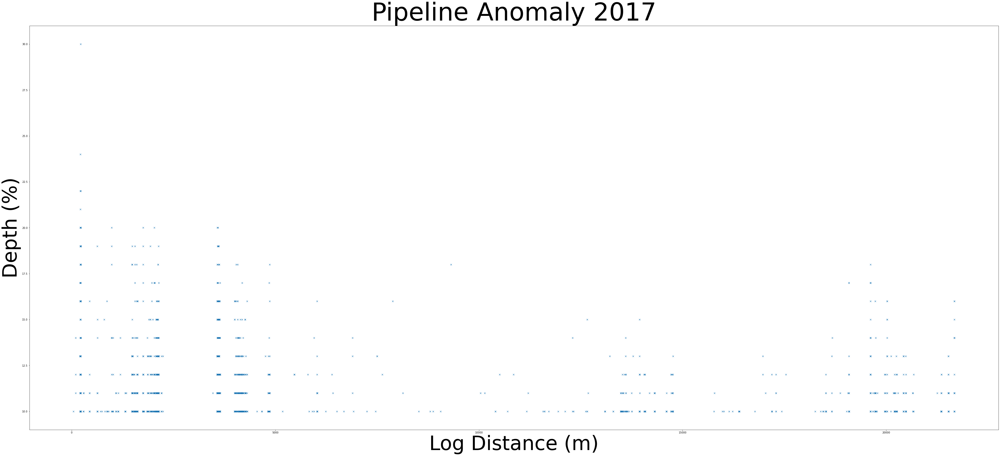

In [6]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, data.depth, 'x')
plt.title('Pipeline Anomaly 2017', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Depth (%)', fontsize = 80)
plt.show()

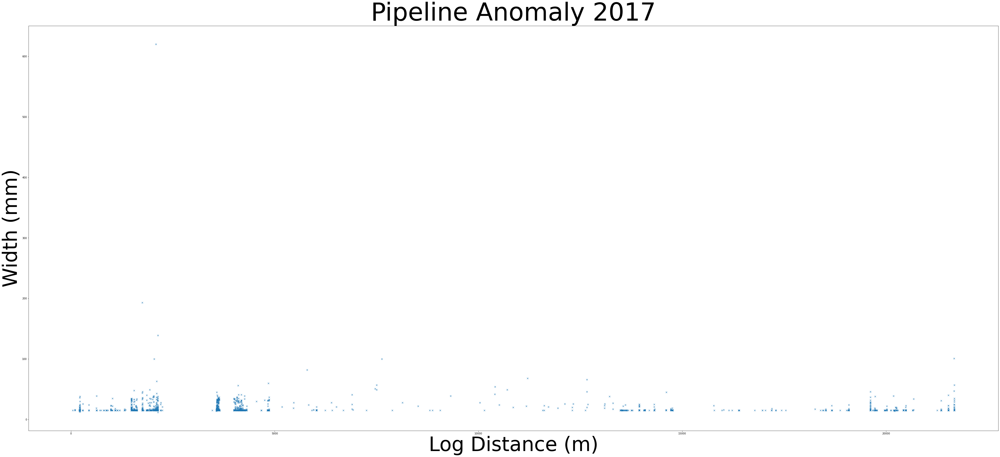

In [7]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, data.width, 'x')
plt.title('Pipeline Anomaly 2017', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Width (mm)', fontsize = 80)
plt.show()

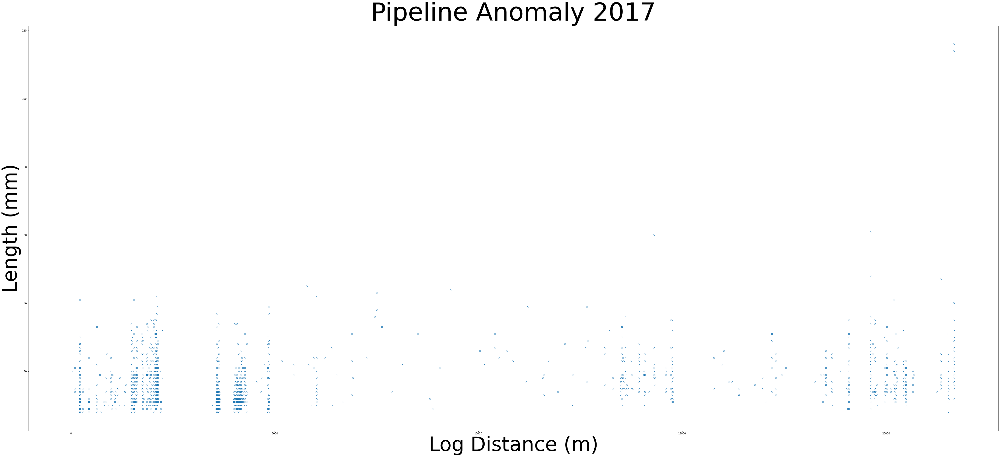

In [8]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, data.length, 'x')
plt.title('Pipeline Anomaly 2017', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Length (mm)', fontsize = 80)
plt.show()

Moving Average Filter

In [9]:
Lraw = round(data.distance.shape[0]/100)

In [10]:
if (Lraw%2==0):
    Lindex = Lraw -1
else:
    Lindex = Lraw

In [11]:
Mraw = max(31, Lindex)

In [12]:
Mindex = int((Mraw+1)/2)

In [13]:
Lraw = round(data.distance.shape[0]/100)
Mindex = int((Mraw+1)/2)

if (Lraw%2==0):
    Lindex = Lraw -1
else:
    Lindex = Lraw
    Mraw = max(31, Lindex)
    
list_movdepth = []
for i in range (1, data.distance.shape[0]-Mraw+2):
    a = i-1
    b = Mraw + i - 3
    sumdepth = sum(data.depth[a:b])
    movdepth = sumdepth/Mraw
    list_movdepth.append(movdepth)
movingdepth = pd.DataFrame({'movdepth' : (list_movdepth)})

In [14]:
list_movlength = []
for i in range (1, data.distance.shape[0]-Mraw+2):
    a = i-1
    b = Mraw + i - 3
    sumlength = sum(data.length[a:b])
    movlength = sumlength/Mraw
    list_movlength.append(movlength)
movinglength = pd.DataFrame({'movlength' : (list_movlength)})

In [15]:
list_movwidth = []
for i in range (1, data.distance.shape[0]-Mraw+2):
    a = i-1
    b = Mraw + i - 3
    sumwidth = sum(data.width[a:b])
    movwidth = sumwidth/Mraw
    list_movwidth.append(movwidth)
movingwidth = pd.DataFrame({'movwidth' : (list_movwidth)})

In [16]:
df1 = pd.DataFrame({'mdepth': (list_movdepth)})
df2 = pd.DataFrame({'mlength': (list_movlength)})
df3 = pd.DataFrame({'mwidth': (list_movwidth)})
df_4 = data.distance[Mindex-1:data.distance.shape[0]-Mindex+1]
df4 = pd.DataFrame ({'distance' : (df_4)})
result = pd.concat([df1, df2, df3], axis=1, join='inner')
result

,mdepth,mlength,mwidth
0,11.451613,10.870968,14.096774
1,11.516129,10.516129,14.096774
2,11.483871,10.387097,14.064516
3,11.451613,10.225806,14.032258
4,11.483871,9.870968,14.032258
...,...,...,...
1753,10.806452,24.258065,20.612903
1754,10.741935,24.419355,20.612903
1755,10.774194,24.870968,20.612903
1756,10.741935,25.000000,20.612903


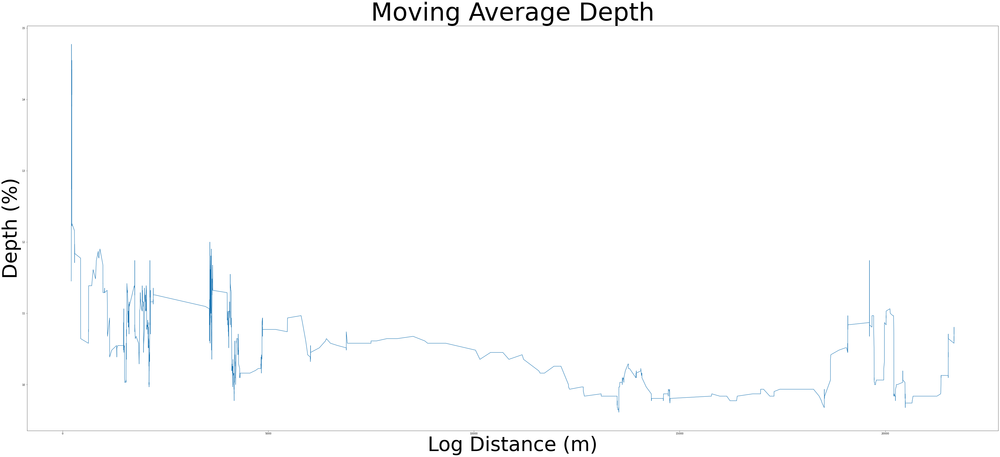

In [17]:
plt.figure(figsize=[70,30])
plt.plot(df_4, list_movdepth)
plt.title ('Moving Average Depth', fontsize=100)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Depth (%)', fontsize=80)
plt.show()

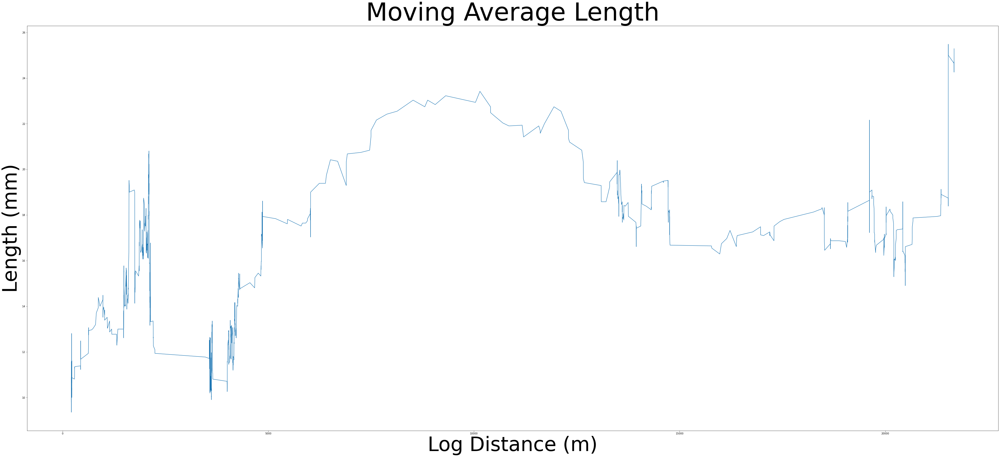

In [18]:
plt.figure(figsize=[70,30])
plt.plot(df_4, list_movlength)
plt.title ('Moving Average Length', fontsize=100)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Length (mm)', fontsize=80)
plt.show()

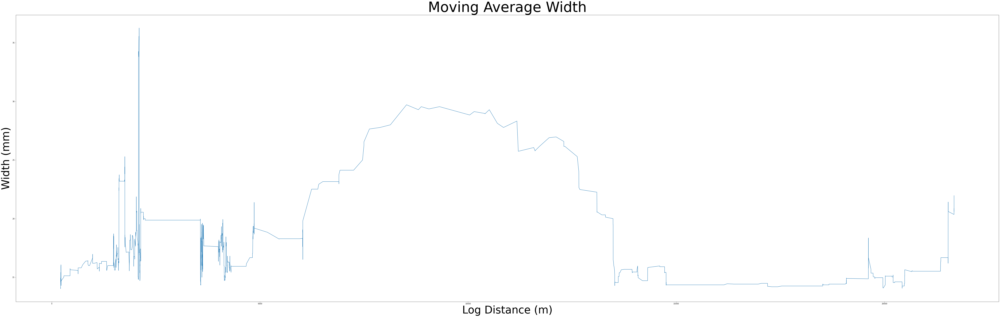

In [27]:
plt.figure(figsize=[100,30])
plt.plot(df_4, list_movwidth)
plt.title ('Moving Average Width', fontsize=80)
plt.xlabel ('Log Distance (m)', fontsize=60)
plt.ylabel ('Width (mm)', fontsize=60)
plt.show()

Moran's Index

In [23]:
depthi = pd.DataFrame({'mdepth_i' : (list_movdepth)})
depthj = pd.DataFrame({'mdepth_j' : (list_movdepth)})
new_depth = pd.concat([depthi, depthj], axis=1, join='inner')
new_depth

,mdepth_i,mdepth_j
0,11.451613,11.451613
1,11.516129,11.516129
2,11.483871,11.483871
3,11.451613,11.451613
4,11.483871,11.483871
...,...,...
1753,10.806452,10.806452
1754,10.741935,10.741935
1755,10.774194,10.774194
1756,10.741935,10.741935


In [24]:
list_xj = []
list_cal1 = []
list_cal3 = []
list_variance = []
for i in range (1, 1759):
    for j in range (i, Mraw-1+i):
        euclidean = math.sqrt((data.distance[j]- data.distance[j-1])**2)
        weightmat = 1/(1+euclidean)
        distance_mean = statistics.mean(data.distance[i-1:Mraw-2+i])
        xj_difference = data.distance[j] - distance_mean
        variance = xj_difference**2
        list_variance.append(variance)
        cal1 = weightmat * xj_difference
        list_cal1.append(cal1)
        list_xj.append(xj_difference)
    sumcal1 = sum(list_cal1)
    sumxj = sum(list_xj)
    sumvar = sum(list_variance)
    xi_difference = data.distance[i] - distance_mean
    cal2 = sumvar/(Mraw-1)
    cal3 = (xi_difference)*(sumcal1)/cal2
    list_cal3.append(cal3)
    list_cal1 = []
    list_xj = []
    list_variance = []
moran0 = pd.DataFrame({'moran0' : (list_cal3)})

In [25]:
moran0

,moran0
0,-18.874611
1,-15.206096
2,-28.177302
3,-17.234771
4,-15.508640
...,...
1753,-3.575463
1754,-4.094368
1755,-5.066326
1756,-6.351928


In [26]:
null_hypothesis = []
for i in range (1, data.distance.shape[0]-29):
    a = 0
    b = (-1/(Mraw-1))
    x = i
    y = (a*i +b)
    null_hypothesis.append(y)
null_hypothesis
data6 = pd.DataFrame({'Null_hypothesis' : (null_hypothesis)})

<function matplotlib.pyplot.show(*args, **kw)>

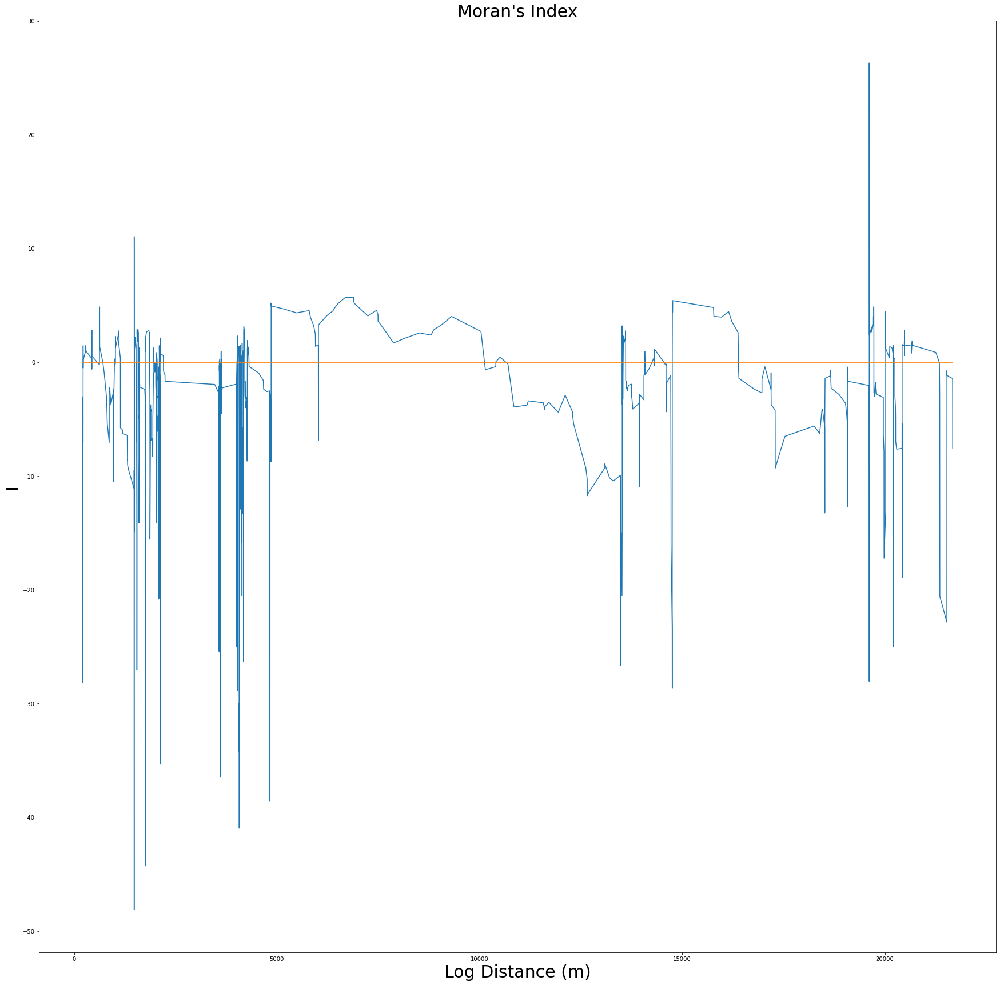

In [27]:
plt.figure(figsize=[30,30])
plt.plot(df_4, list_cal3, label='Moran\'s Index')
plt.title('Moran\'s Index', fontsize = 30)
plt.plot (df_4, null_hypothesis, label='Null Hypothesis')
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('I', fontsize= 30)
plt.show

In [28]:
list_null = []
for i in range (1, data.distance.shape[0]-29):
    null = data.distance[i-1]
    if (-1 < moran0.moran0[i-1] < 1):
        list_null.append(null)
data_null = pd.DataFrame({'null' : (list_null)})
data_null

,null
0,222.02
1,222.07
2,222.13
3,222.17
4,222.31
...,...
349,20485.93
350,20486.05
351,21529.23
352,21529.59


Segmentation

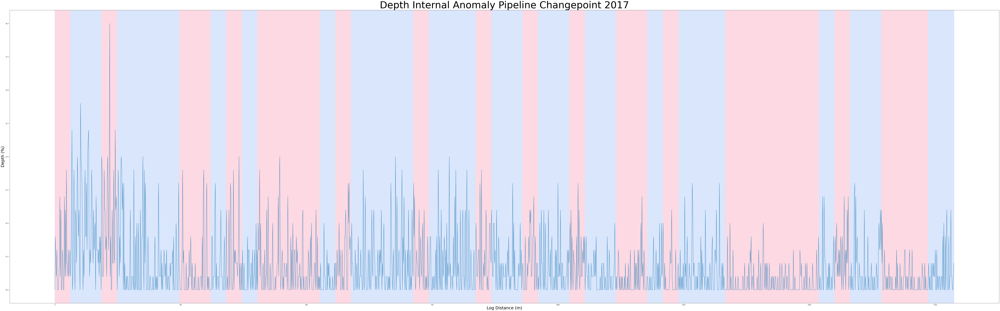

In [47]:
# change point detection
model = "l1"  # "l2", "rbf"
algo = rpt.Pelt(model=model, min_size=3, jump=31).fit(data.depth.values)
my_bkps = algo.predict(pen=0)
my_bkps.insert(0, 0)
df_changepoint = pd.DataFrame({'changepoint' : (my_bkps)})

list_defect_difference = []
for i in range (1, df_changepoint.changepoint.shape[0]):
    for j in range (1, df_changepoint.changepoint.shape[0]):
        defect_difference = df_changepoint.changepoint[j] - df_changepoint.changepoint[j-1]
        list_defect_difference.append(defect_difference)
    if min(list_defect_difference) < 30 :
        my_bkps = algo.predict(pen=i)
        my_bkps.insert(0, 0)
        df_changepoint = pd.DataFrame({'changepoint' : (my_bkps)})
        list_defect_difference = []
    else:
        my_bkps = algo.predict(pen=i-1)
        my_bkps.insert(0, 0)
        df_changepoint = pd.DataFrame({'changepoint' : (my_bkps)})
        list_defect_difference = []
        break

# show results
rpt.display(data.depth, my_bkps, figsize=(100, 30))
plt.title('Depth Internal Anomaly Pipeline Changepoint 2017', fontsize = 70)
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('Depth (%)', fontsize= 30)
plt.show()

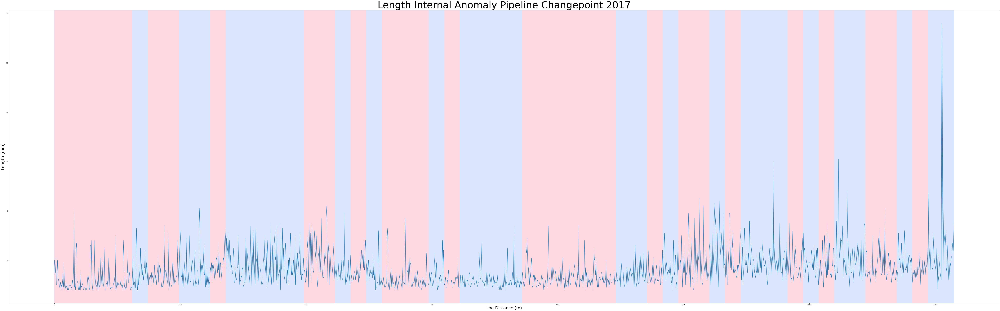

In [48]:
# change point detection
model_length = "l1"  # "l2", "rbf"
algo_length = rpt.Pelt(model=model, min_size=3, jump=31).fit(data.length.values)
my_bkps_length = algo_length.predict(pen=0)
my_bkps_length.insert(0, 0)
df_changepoint_length = pd.DataFrame({'changepoint' : (my_bkps_length)})

list_defect_difference_length = []
for i in range (1, df_changepoint_length.changepoint.shape[0]):
    for j in range (1, df_changepoint_length.changepoint.shape[0]):
        defect_difference_length = df_changepoint_length.changepoint[j] - df_changepoint_length.changepoint[j-1]
        list_defect_difference_length.append(defect_difference_length)
    if min(list_defect_difference_length) < 30 :
        my_bkps_length = algo_length.predict(pen=i)
        my_bkps_length.insert(0, 0)
        df_changepoint_length = pd.DataFrame({'changepoint' : (my_bkps_length)})
        list_defect_difference_length = []
    else:
        my_bkps_length = algo_length.predict(pen=i-1)
        my_bkps_length.insert(0, 0)
        df_changepoint_length = pd.DataFrame({'changepoint' : (my_bkps_length)})
        list_defect_difference_length = []
        break

# show results
rpt.display(data.length, my_bkps_length, figsize=(100, 30))
plt.title('Length Internal Anomaly Pipeline Changepoint 2017', fontsize = 70)
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('Length (mm)', fontsize= 30)
plt.show()

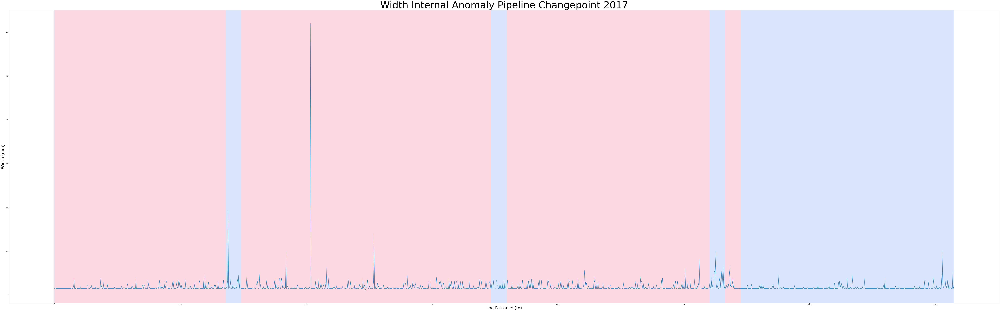

In [49]:
# change point detection
model_width = "l1"  # "l2", "rbf"
algo_width = rpt.Pelt(model=model, min_size=3, jump=31).fit(data.width.values)
my_bkps_width = algo_width.predict(pen=0)
my_bkps_width.insert(0, 0)
df_changepoint_width = pd.DataFrame({'changepoint' : (my_bkps_width)})

list_defect_difference_width = []
for i in range (1, df_changepoint_width.changepoint.shape[0]):
    for j in range (1, df_changepoint_width.changepoint.shape[0]):
        defect_difference_width = df_changepoint_width.changepoint[j] - df_changepoint_width.changepoint[j-1]
        list_defect_difference_width.append(defect_difference_width)
    if min(list_defect_difference_width) < 30 :
        my_bkps_width = algo_width.predict(pen=i)
        my_bkps_width.insert(0, 0)
        df_changepoint_width = pd.DataFrame({'changepoint' : (my_bkps_width)})
        list_defect_difference_width = []
    else:
        my_bkps_width = algo_width.predict(pen=i-1)
        my_bkps_width.insert(0, 0)
        df_changepoint_width = pd.DataFrame({'changepoint' : (my_bkps_width)})
        list_defect_difference_width = []
        break

# show results
rpt.display(data.width, my_bkps_width, figsize=(100, 30))
plt.title('Width Internal Anomaly Pipeline Changepoint 2017', fontsize = 70)
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('Width (mm)', fontsize= 30)
plt.show()

In [33]:
list_segment = []
for i in range (1, df_changepoint.changepoint.shape[0]):
    for j in range (1, df_changepoint.changepoint[i]-df_changepoint.changepoint[i-1]+1):
        a = 0
        b = statistics.mean(data.depth[df_changepoint.changepoint[i-1]: df_changepoint.changepoint[i]])
        x = i
        y = (a*i +b)
        list_segment.append(y)
segmentav = pd.DataFrame({'segmentav' : (list_segment)})

In [34]:
list_segment_width = []
for i in range (1, df_changepoint_width.changepoint.shape[0]):
    for j in range (1, df_changepoint_width.changepoint[i]-df_changepoint_width.changepoint[i-1]+1):
        a = 0
        b = statistics.mean(data.width[df_changepoint_width.changepoint[i-1]: df_changepoint_width.changepoint[i]])
        x = i
        y = (a*i +b)
        list_segment_width.append(y)
segmentav_width = pd.DataFrame({'segmentav' : (list_segment_width)})

In [35]:
list_segment_length = []
for i in range (1, df_changepoint_length.changepoint.shape[0]):
    for j in range (1, df_changepoint_length.changepoint[i]-df_changepoint_length.changepoint[i-1]+1):
        a = 0
        b = statistics.mean(data.length[df_changepoint_length.changepoint[i-1]: df_changepoint_length.changepoint[i]])
        x = i
        y = (a*i +b)
        list_segment_length.append(y)
segmentav_length = pd.DataFrame({'segmentav' : (list_segment_length)})

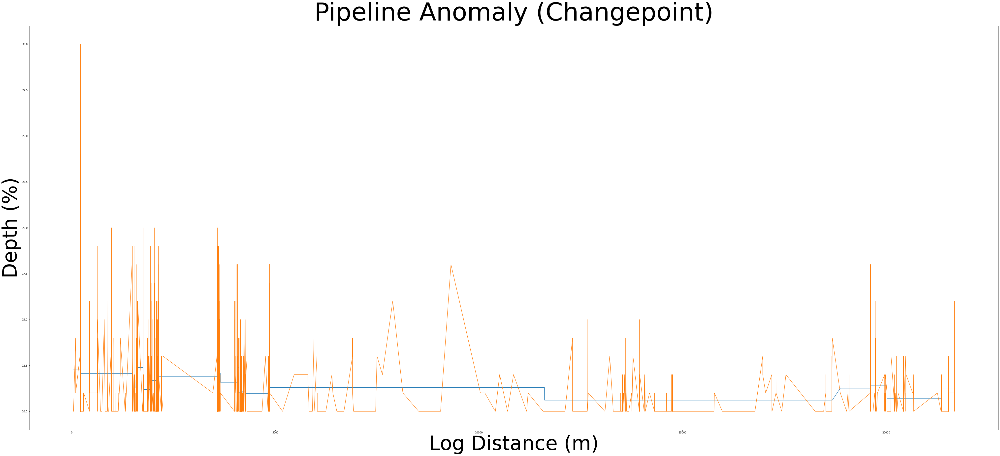

In [36]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, list_segment)
plt.title('Pipeline Anomaly (Changepoint)', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Depth (%)', fontsize = 80)
plt.plot(data.distance, data.depth)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Depth (%)', fontsize=80)
plt.show()

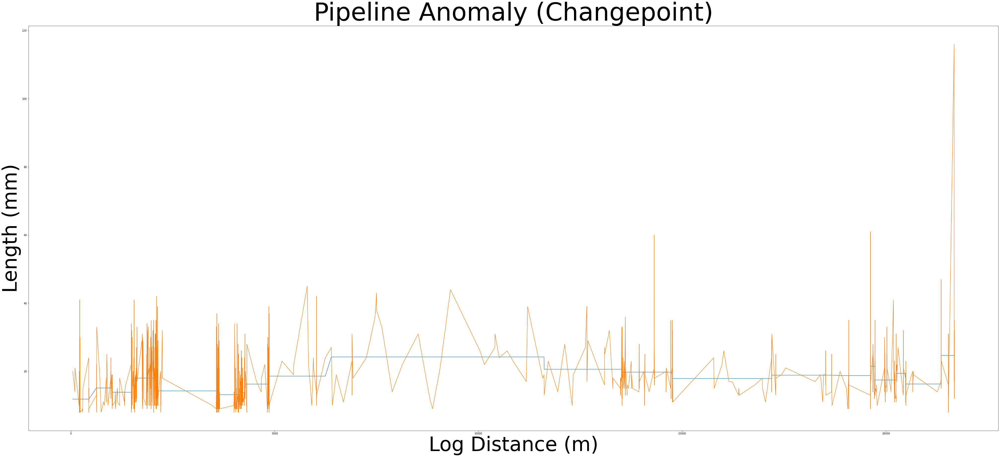

In [37]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, list_segment_length)
plt.title('Pipeline Anomaly (Changepoint)', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Length (mm)', fontsize = 80)
plt.plot(data.distance, data.length)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Length (mm)', fontsize=80)
plt.show()

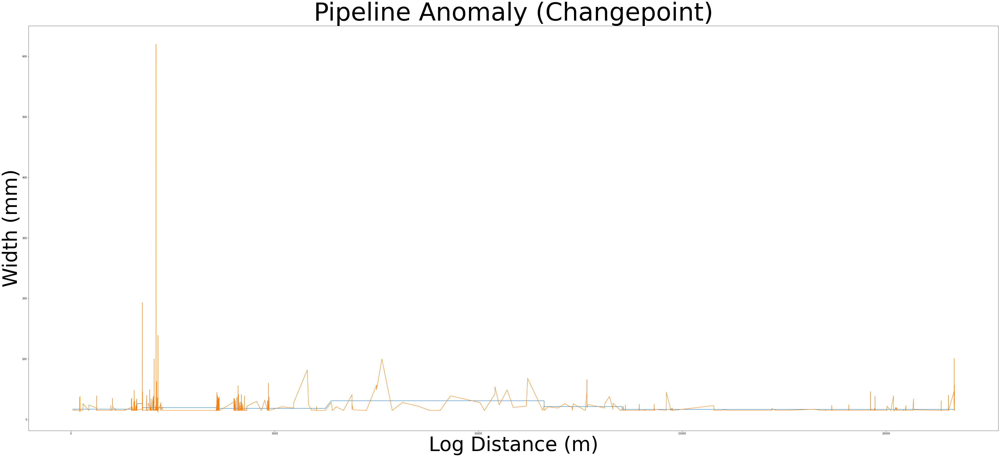

In [38]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, list_segment_width)
plt.title('Pipeline Anomaly (Changepoint)', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Width (mm)', fontsize = 80)
plt.plot(data.distance, data.width)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Width (mm)', fontsize=80)
plt.show()

In [39]:
data2 = pd.read_csv('ILI2011.csv')

In [40]:
data2

,distance,depth,length,width
0,97.845,10,14,22
1,100.343,10,14,15
2,219.666,11,19,19
3,220.914,10,14,15
4,221.958,10,11,15
...,...,...,...,...
1634,21530.332,11,34,28
1635,21530.380,13,19,15
1636,21530.425,15,26,31
1637,21530.805,11,23,16


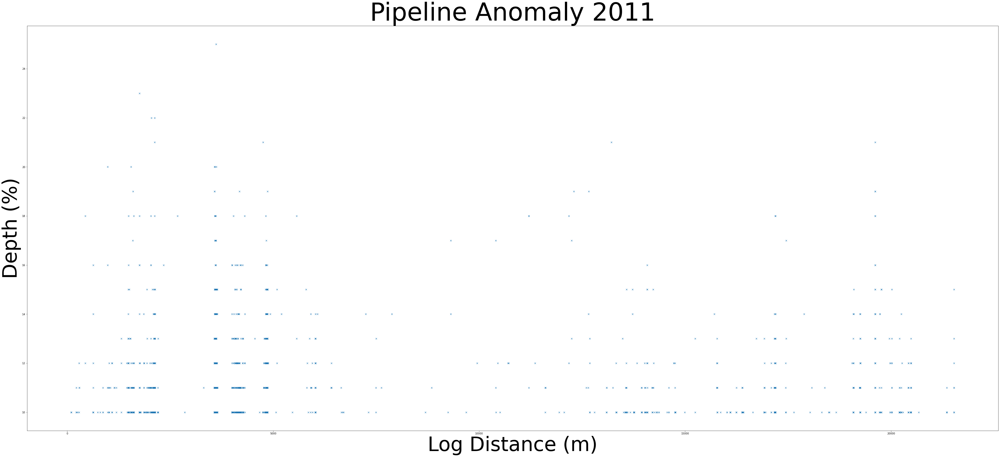

In [41]:
plt.figure(figsize=[70,30])
plt.plot(data2.distance, data2.depth, 'x')
plt.title('Pipeline Anomaly 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Depth (%)', fontsize = 80)
plt.show()

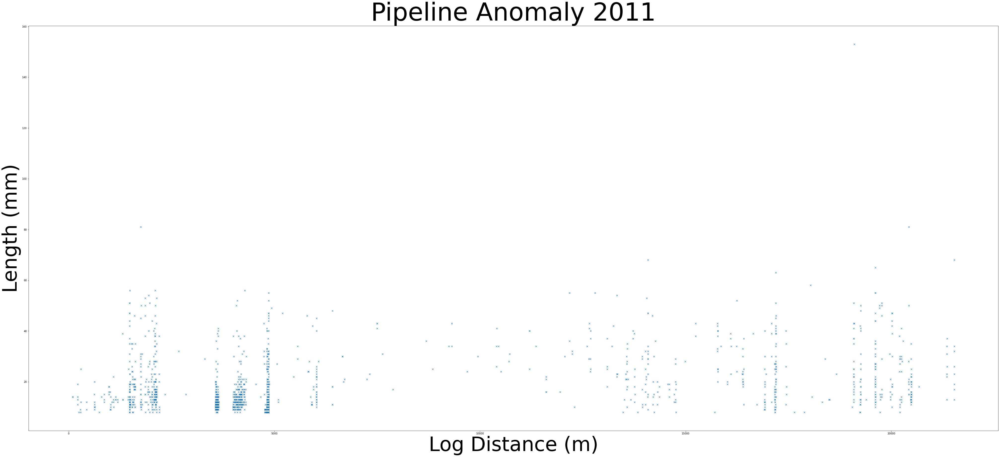

In [42]:
plt.figure(figsize=[70,30])
plt.plot(data2.distance, data2.length, 'x')
plt.title('Pipeline Anomaly 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Length (mm)', fontsize = 80)
plt.show()

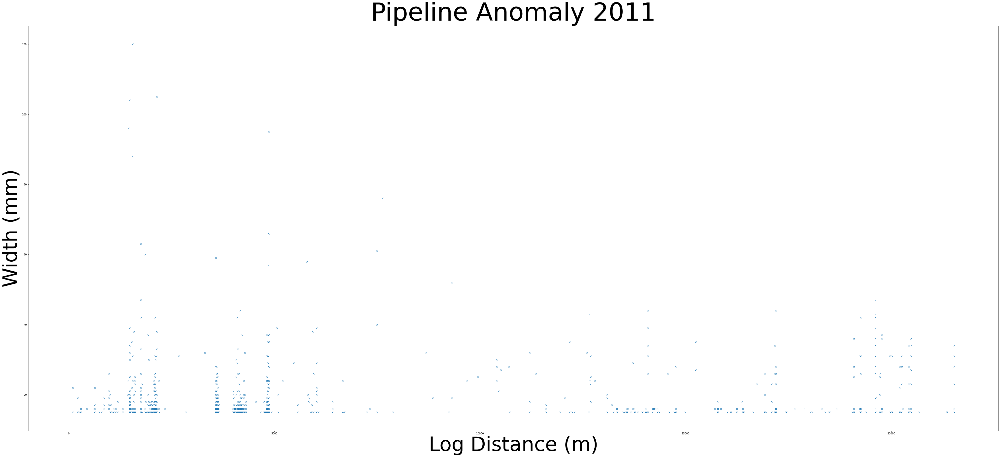

In [43]:
plt.figure(figsize=[70,30])
plt.plot(data2.distance, data2.width, 'x')
plt.title('Pipeline Anomaly 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Width (mm)', fontsize = 80)
plt.show()

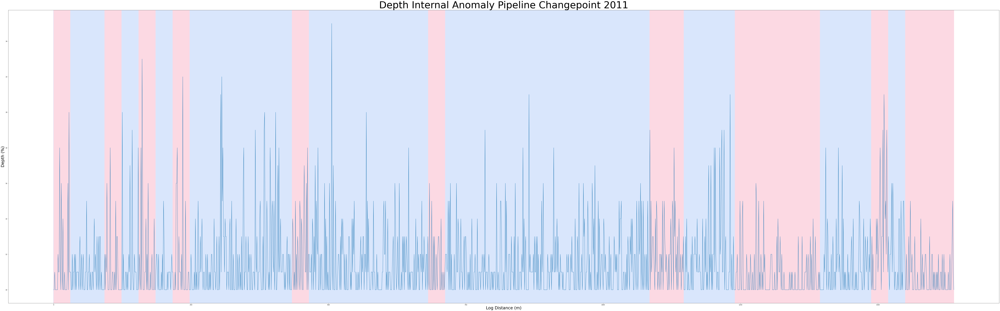

In [44]:
# change point detection
model2 = "l1"  # "l2", "rbf"
algo2 = rpt.Pelt(model=model, min_size=3, jump=31).fit(data2.depth.values)
my_bkps2 = algo.predict(pen=0)
my_bkps2.insert(0, 0)
df_changepoint2 = pd.DataFrame({'changepoint' : (my_bkps2)})

list_defect_difference2 = []
for i in range (1, df_changepoint2.changepoint.shape[0]):
    for j in range (1, df_changepoint2.changepoint.shape[0]):
        defect_difference2 = df_changepoint2.changepoint[j] - df_changepoint2.changepoint[j-1]
        list_defect_difference2.append(defect_difference2)
    if min(list_defect_difference2) < 30 :
        my_bkps2 = algo2.predict(pen=i)
        my_bkps2.insert(0, 0)
        df_changepoint2 = pd.DataFrame({'changepoint' : (my_bkps2)})
        list_defect_difference2 = []
    else:
        my_bkps2 = algo2.predict(pen=i-1)
        my_bkps2.insert(0, 0)
        df_changepoint2 = pd.DataFrame({'changepoint' : (my_bkps2)})
        list_defect_difference2 = []
        break

# show results
rpt.display(data2.depth, my_bkps2, figsize=(100, 30))
plt.title('Depth Internal Anomaly Pipeline Changepoint 2011', fontsize = 70)
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('Depth (%)', fontsize= 30)
plt.show()

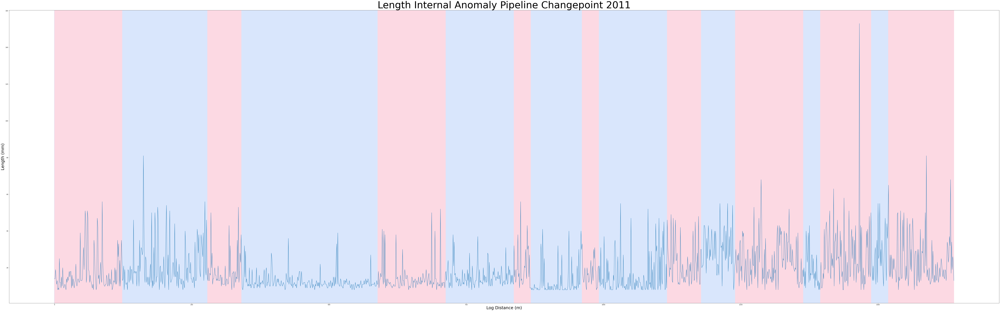

In [50]:
# change point detection
model2_length = "l1"  # "l2", "rbf"
algo2_length = rpt.Pelt(model=model, min_size=3, jump=31).fit(data2.length.values)
my_bkps2_length = algo2_length.predict(pen=0)
my_bkps2_length.insert(0, 0)
df_changepoint2_length = pd.DataFrame({'changepoint' : (my_bkps2_length)})

list_defect_difference2_length = []
for i in range (1, df_changepoint2_length.changepoint.shape[0]):
    for j in range (1, df_changepoint2_length.changepoint.shape[0]):
        defect_difference2_length = df_changepoint2_length.changepoint[j] - df_changepoint2_length.changepoint[j-1]
        list_defect_difference2_length.append(defect_difference2_length)
    if min(list_defect_difference2_length) < 30 :
        my_bkps2_length = algo2_length.predict(pen=i)
        my_bkps2_length.insert(0, 0)
        df_changepoint2_length = pd.DataFrame({'changepoint' : (my_bkps2_length)})
        list_defect_difference2_length = []
    else:
        my_bkps2_length = algo2_length.predict(pen=i-1)
        my_bkps2_length.insert(0, 0)
        df_changepoint2_length = pd.DataFrame({'changepoint' : (my_bkps2_length)})
        list_defect_difference2_length = []
        break

# show results
rpt.display(data2.length, my_bkps2_length, figsize=(100, 30))
plt.title('Length Internal Anomaly Pipeline Changepoint 2011', fontsize = 70)
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('Length (mm)', fontsize= 30)
plt.show()

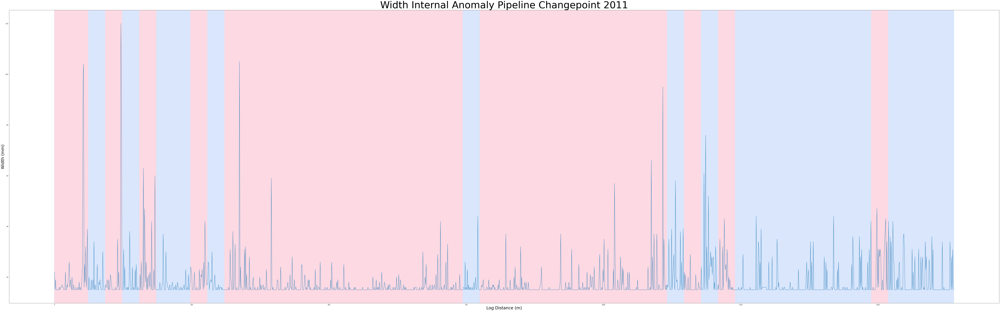

In [51]:
# change point detection
model2_width = "l1"  # "l2", "rbf"
algo2_width = rpt.Pelt(model=model, min_size=3, jump=31).fit(data2.width.values)
my_bkps2_width = algo2_width.predict(pen=0)
my_bkps2_width.insert(0, 0)
df_changepoint2_width = pd.DataFrame({'changepoint' : (my_bkps2_width)})

list_defect_difference2_width = []
for i in range (1, df_changepoint2_width.changepoint.shape[0]):
    for j in range (1, df_changepoint2_width.changepoint.shape[0]):
        defect_difference2_width = df_changepoint2_width.changepoint[j] - df_changepoint2_width.changepoint[j-1]
        list_defect_difference2_width.append(defect_difference2_width)
    if min(list_defect_difference2_width) < 30 :
        my_bkps2_width = algo2_width.predict(pen=i)
        my_bkps2_width.insert(0, 0)
        df_changepoint2_width = pd.DataFrame({'changepoint' : (my_bkps2_width)})
        list_defect_difference2_width = []
    else:
        my_bkps2_width = algo2_width.predict(pen=i-1)
        my_bkps2_width.insert(0, 0)
        df_changepoint2_width = pd.DataFrame({'changepoint' : (my_bkps2_width)})
        list_defect_difference2_width = []
        break

# show results
rpt.display(data2.width, my_bkps2_width, figsize=(100, 30))
plt.title('Width Internal Anomaly Pipeline Changepoint 2011', fontsize = 70)
plt.xlabel('Log Distance (m)', fontsize = 30)
plt.ylabel('Width (mm)', fontsize= 30)
plt.show()

In [52]:
list_segment2 = []
for i in range (1, df_changepoint2.changepoint.shape[0]):
    for j in range (1, df_changepoint2.changepoint[i]-df_changepoint2.changepoint[i-1]+1):
        a = 0
        b = statistics.mean(data2.depth[df_changepoint2.changepoint[i-1]: df_changepoint2.changepoint[i]])
        x = i
        y = (a*i +b)
        list_segment2.append(y)
segmentav2 = pd.DataFrame({'segmentav' : (list_segment2)})

In [53]:
list_segment2_length = []
for i in range (1, df_changepoint2_length.changepoint.shape[0]):
    for j in range (1, df_changepoint2_length.changepoint[i]-df_changepoint2_length.changepoint[i-1]+1):
        a = 0
        b = statistics.mean(data2.length[df_changepoint2_length.changepoint[i-1]: df_changepoint2_length.changepoint[i]])
        x = i
        y = (a*i +b)
        list_segment2_length.append(y)
segmentav2_length = pd.DataFrame({'segmentav' : (list_segment2_length)})

In [54]:
list_segment2_width = []
for i in range (1, df_changepoint2_width.changepoint.shape[0]):
    for j in range (1, df_changepoint2_width.changepoint[i]-df_changepoint2_width.changepoint[i-1]+1):
        a = 0
        b = statistics.mean(data2.width[df_changepoint2_width.changepoint[i-1]: df_changepoint2_width.changepoint[i]])
        x = i
        y = (a*i +b)
        list_segment2_width.append(y)
segmentav2_width = pd.DataFrame({'segmentav' : (list_segment2_width)})

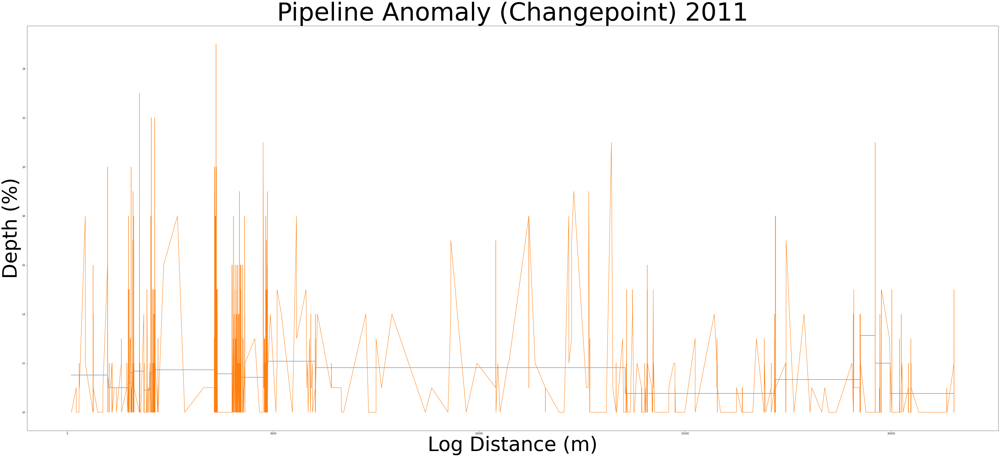

In [55]:
plt.figure(figsize=[70,30])
plt.plot(data2.distance, list_segment2)
plt.title('Pipeline Anomaly (Changepoint) 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Depth (%)', fontsize = 80)
plt.plot(data2.distance, data2.depth)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Depth (%)', fontsize=80)
plt.show()

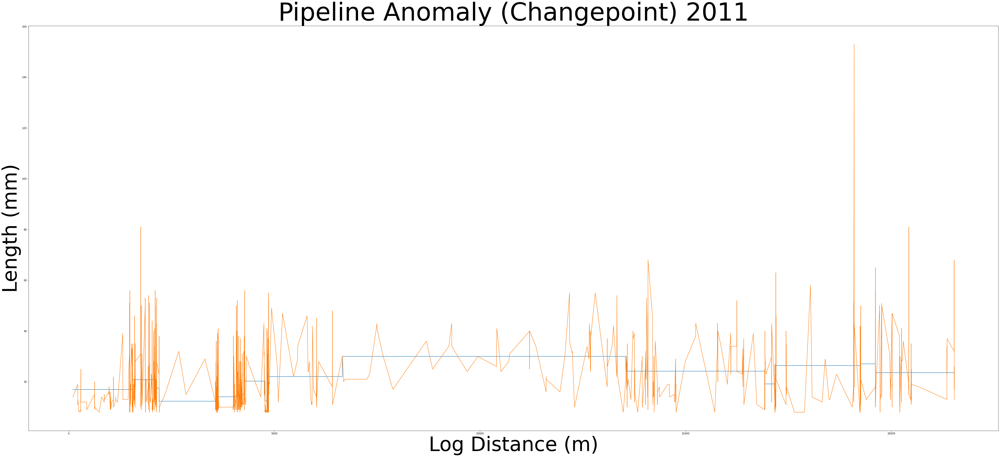

In [56]:
plt.figure(figsize=[70,30])
plt.plot(data2.distance, list_segment2_length)
plt.title('Pipeline Anomaly (Changepoint) 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Length (mm)', fontsize = 80)
plt.plot(data2.distance, data2.length)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Length (mm)', fontsize=80)
plt.show()

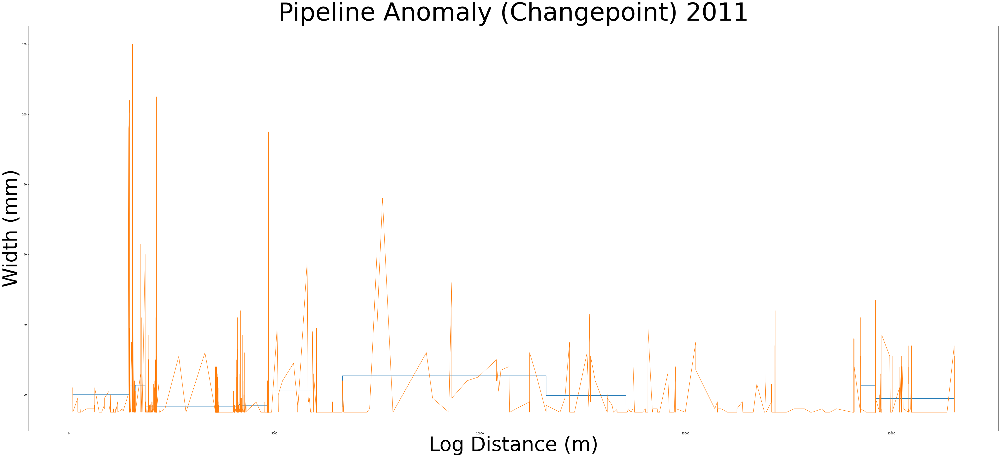

In [57]:
plt.figure(figsize=[70,30])
plt.plot(data2.distance, list_segment2_width)
plt.title('Pipeline Anomaly (Changepoint) 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Width (mm)', fontsize = 80)
plt.plot(data2.distance, data2.width)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Width (mm)', fontsize=80)
plt.show()

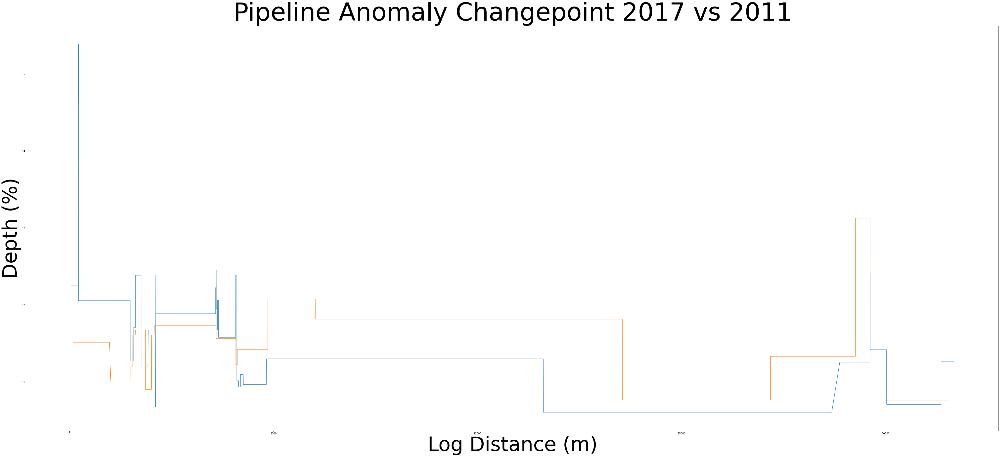

In [58]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, list_segment, label = '2017')
plt.title('Pipeline Anomaly Changepoint 2017 vs 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Depth (%)', fontsize = 80)
plt.plot(data2.distance, list_segment2, label = 2011)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Depth (%)', fontsize=80)
plt.show()

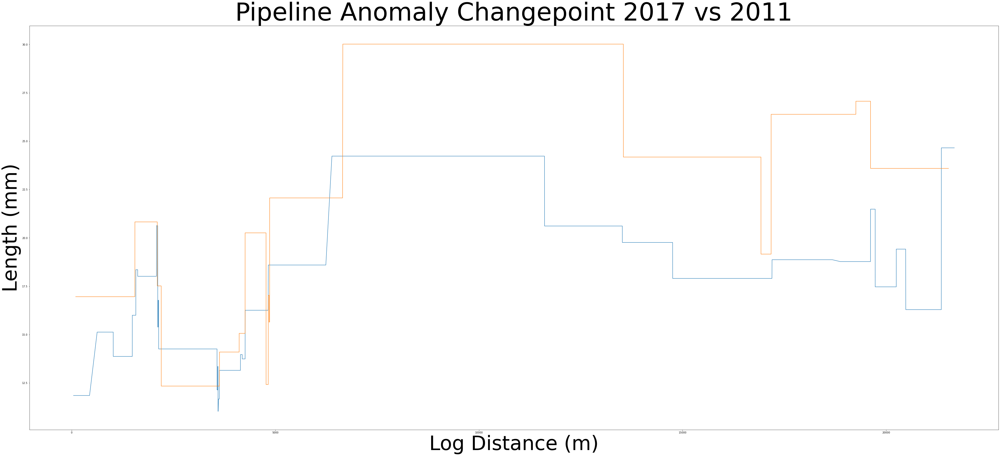

In [59]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, list_segment_length, label = '2017')
plt.title('Pipeline Anomaly Changepoint 2017 vs 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Length (mm)', fontsize = 80)
plt.plot(data2.distance, list_segment2_length, label = 2011)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Length (mm)', fontsize=80)
plt.show()

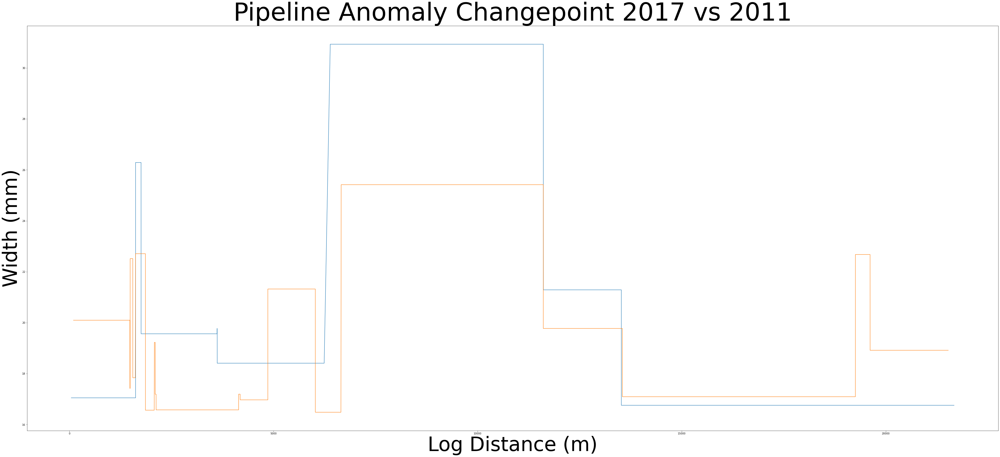

In [60]:
plt.figure(figsize=[70,30])
plt.plot(data.distance, list_segment_width, label = '2017')
plt.title('Pipeline Anomaly Changepoint 2017 vs 2011', fontsize = 100)
plt.xlabel('Log Distance (m)', fontsize = 80)
plt.ylabel('Width (mm)', fontsize = 80)
plt.plot(data2.distance, list_segment2_width, label = 2011)
plt.xlabel ('Log Distance (m)', fontsize=80)
plt.ylabel ('Width (mm)', fontsize=80)
plt.show()